# Lecture 9 - Special Topics in Image Processing Part 2 (Supplementary Notebook)

This notebook is a supplementary notebook to the lecture discussions on special topics. We briefly introduce **template matching** and what the limitations of our basic methods.

The contents of this notebook is compiled from the following references:

- C Alis,*"Introduction to Digital Image"*, IIP 2018

Organized by:
Benjur Emmanuel L. Borja

---

## Template Matching
Template matching is a technique for finding a reference image known as template image in a bigger image known as the source image. This technique is particularly useful in image detection and recognition, as well as object tracking.

The algorithm for template matching is quite intuitive. The template is compared to each part of the source image, sliding one pixel at a time. The result is another image (or matrix) with each pixel value corresponding to how similar the template image is to the source image when placed at that pixel location. From the resulting image, we then look for peaks to determine where in the source image, the template image is found. Actual implementations of template matching differ on the measure of similarity and method for efficient multiple comparisons.

As an example, consider the image of an aircraft carrier below.

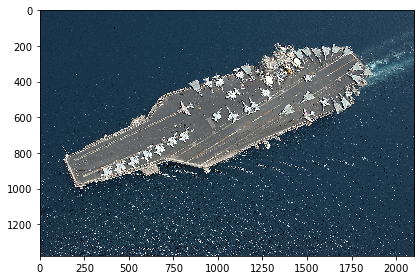

In [1]:
from skimage.io import imread, imshow
carrier = imread('aircraft_carrier.jpg')
imshow(carrier);

Template matching works for color images but is simpler with grayscale or binarized images. For this example, let's work with a grayscale image.

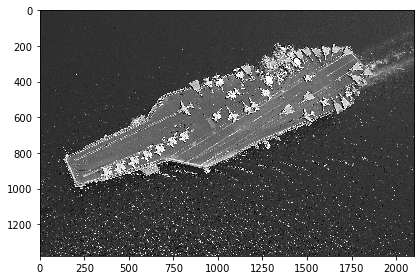

In [2]:
from skimage.color import rgb2gray
carrier_gray = rgb2gray(carrier)
imshow(carrier_gray);

Let's select one of the planes as a template:

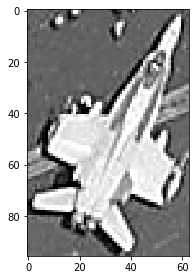

In [3]:
template = carrier_gray[648:744,775:838]
imshow(template);

We use `match_template` to perform template matching.

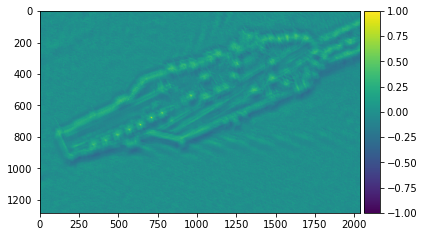

In [4]:
from skimage.feature import match_template

result = match_template(carrier_gray, template)
imshow(result, cmap='viridis');

We can see that there are several brightly colored areas. If we assume that the template is found only once in the source image then we can find where it is by looking for the pixel with the highest value.

In [5]:
import numpy as np
x, y = np.unravel_index(np.argmax(result), result.shape)
print((x, y))

(648, 775)


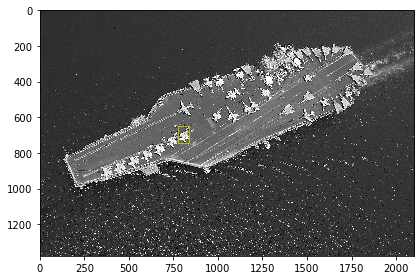

In [6]:
import matplotlib.pyplot as plt
imshow(carrier_gray)
template_width, template_height = template.shape
rect = plt.Rectangle((y, x), template_height, template_width, color='y', 
                     fc='none')
plt.gca().add_patch(rect);

To locate multiple matches of a template, we look for peaks that have at least a certain value for correlation.

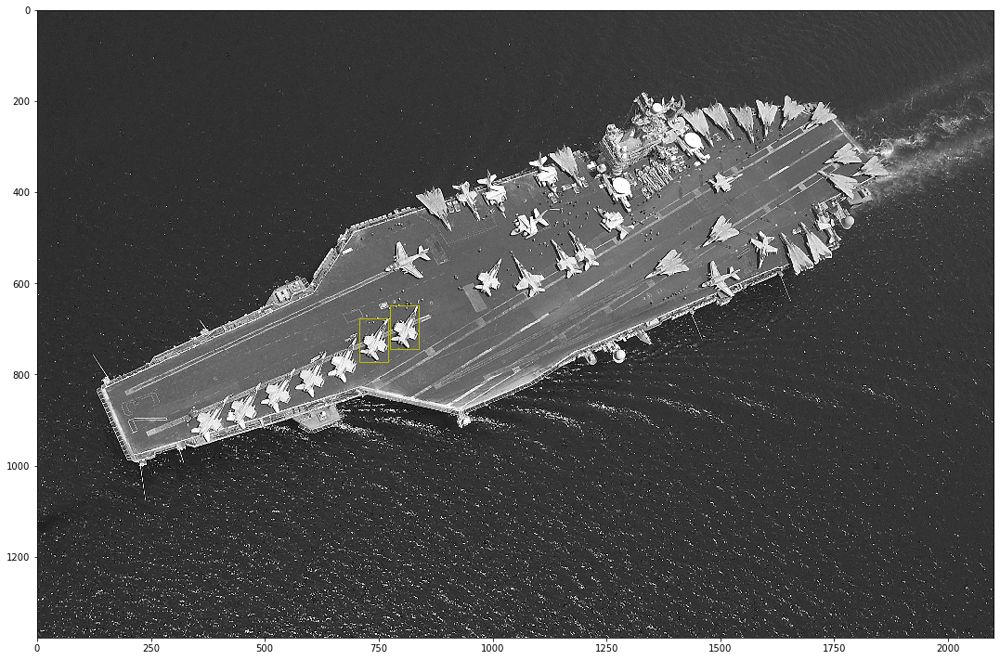

In [14]:
from skimage.feature import peak_local_max

plt.figure(figsize=(15,10))
imshow(carrier_gray)
template_width, template_height = template.shape
for x, y in peak_local_max(result, threshold_abs=0.8):
    rect = plt.Rectangle((y, x), template_height, template_width, color='y', 
                         fc='none')
    plt.gca().add_patch(rect);

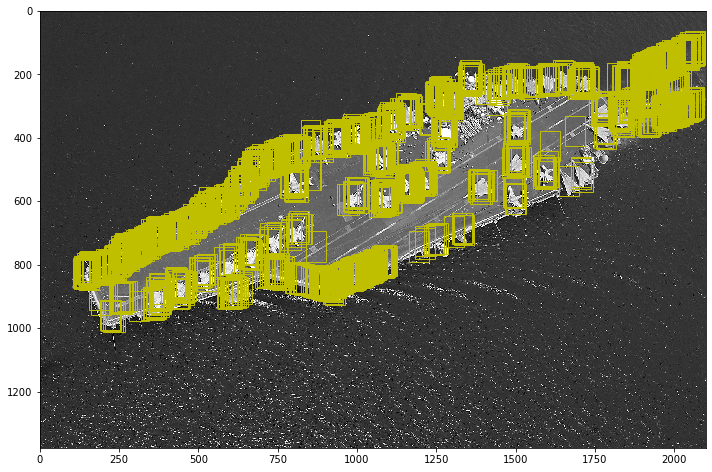

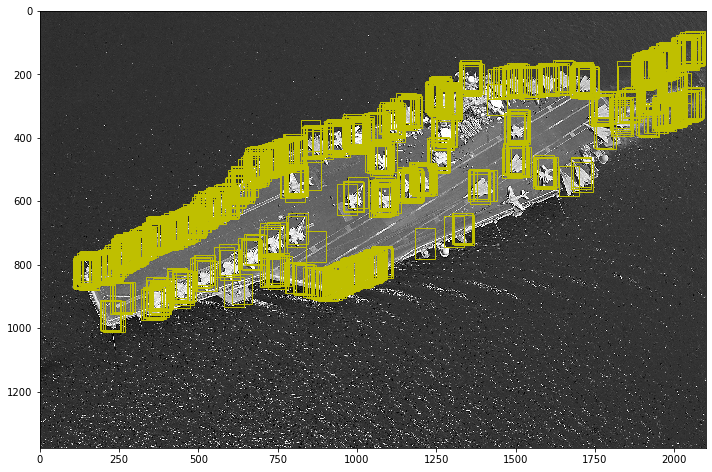

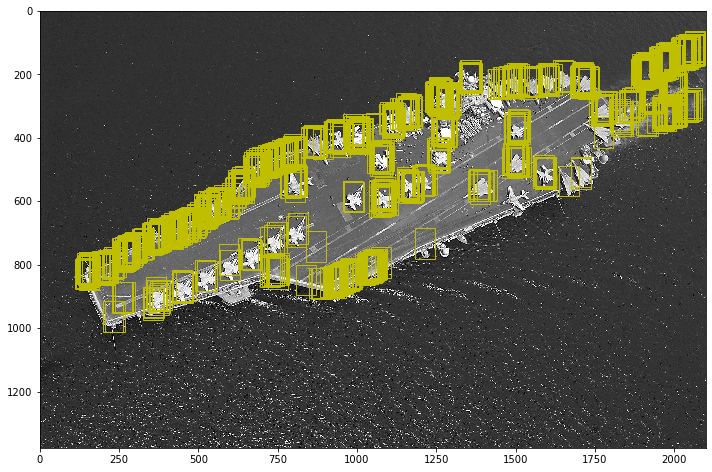

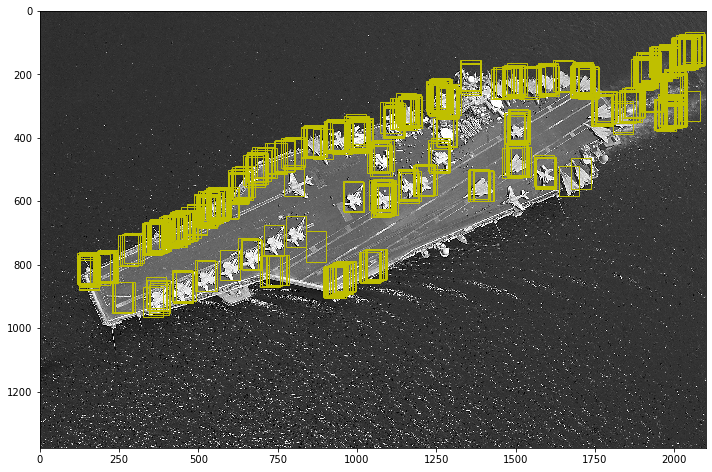

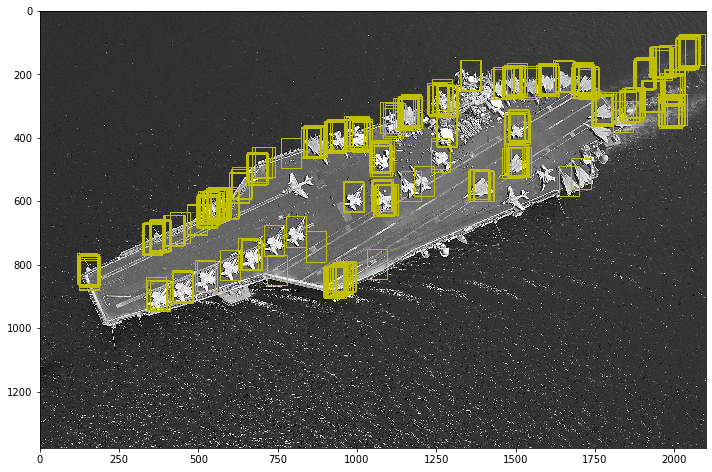

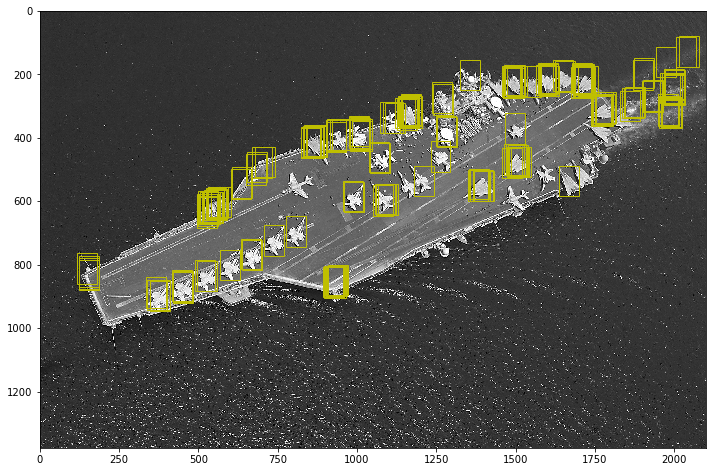

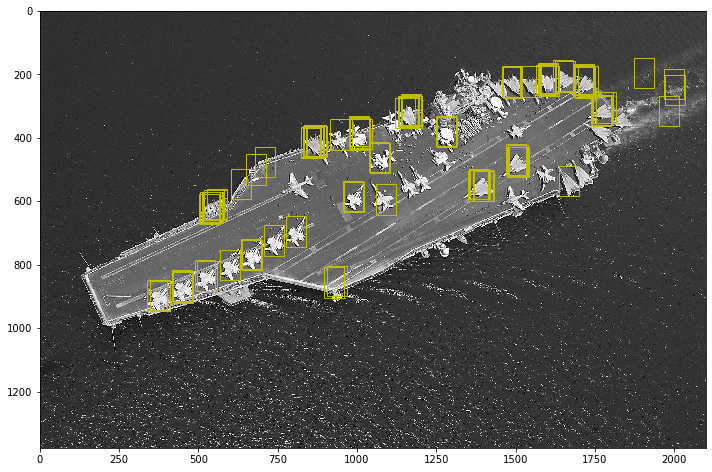

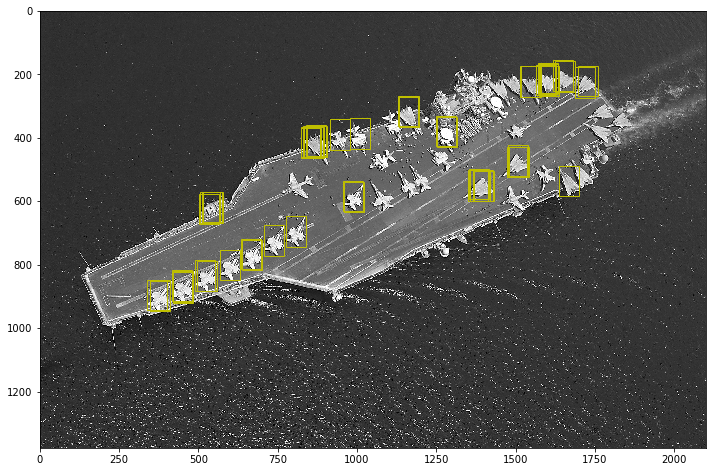

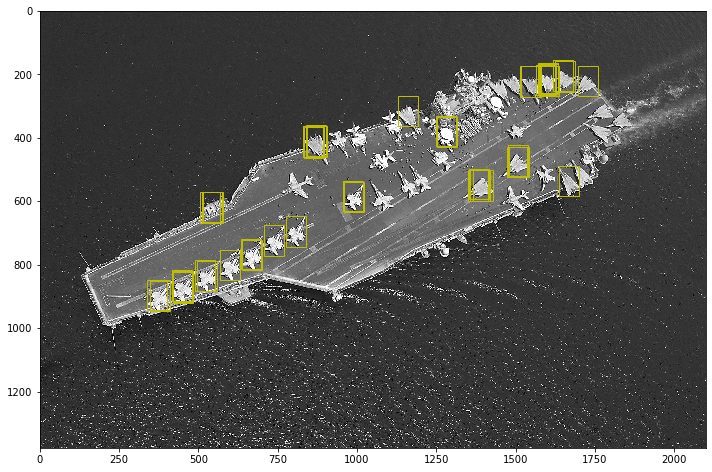

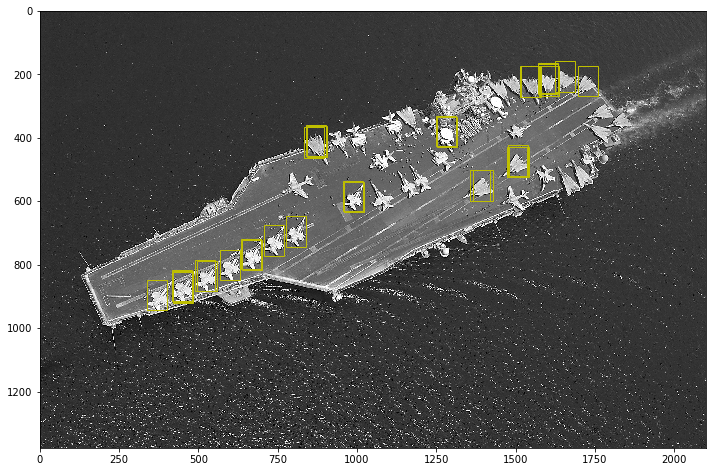

In [30]:
from skimage.feature import peak_local_max

thresholds = np.arange(0.2, 0.4, 0.02)
template_width, template_height = template.shape

for ix, n in enumerate(thresholds):
    plt.figure(figsize=(10,7))
    imshow(carrier_gray)
    
    for x, y in peak_local_max(result, threshold_abs=n):
        rect = plt.Rectangle((y, x), template_height, template_width,
                             color='y', fc='none')
        plt.gca().add_patch(rect)
        
    plt.show()

As the series of images above has shown, the threshold value dictates how many matches on the template are found.  More importantly, however, the threshold also dictates how accurate those matches are.  Clearly, it is possible to detect all the planes with a single template. However, this is at the expense of many false positives also being identified.

#### Exercise:
Based on our knowledge of template matching and how our images works, try to answer the following questions:
1. Will you still be able to detect the airplanes if you enlarge the template?
1. Will you still be able to detect the airplanes if you flip the template image?
1. Will you still be able to detect the airplanes if you change the contrast of the image?

As the following sections will demonstrate template matching is highly sensitive to the relative states of the template and the raw image.  Of the three experiments listed, only rotation displays some measure of success, which is to be expected as the original template can pick up rotated samples at a suitably low threshold.  In the case of enlarged and higher-contrast templates, the threshold to begin picking up any areas is very low; and furthermore, the template more often than not ends up matching with image sections completely unrelated to our actual desired outcomes.

This serves to highlight that the template needs to be close to the original in terms of scale, exposure, and orientation to achieve the best results.  Thinking on it further, this makes sense in that, to a computer, images are a series of "pixel-value relations." That is, the machine does not necessarily know the significance of two neighbouring pixels, only that they are a certain ratio and arrangement of values to each other.  In which case, either image processing techniques need to be applied first in order for an external template to be applied to an image, or a template sourced from the original image is best.

#### Larger template

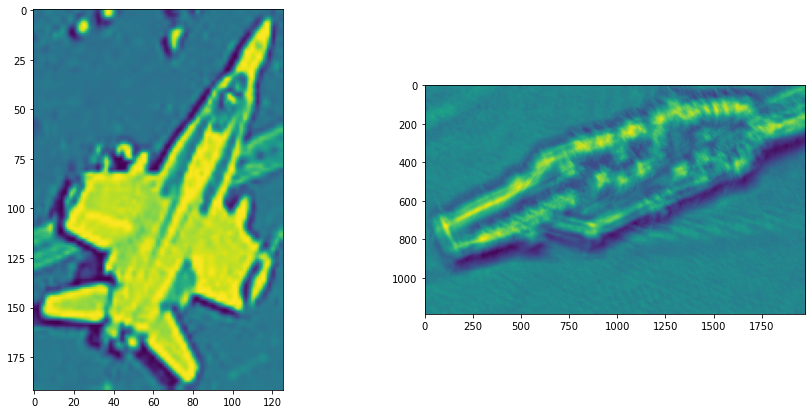

In [36]:
from skimage.transform import rescale
template2 = rescale(carrier_gray[648:744,775:838], 2)
result2 = match_template(carrier_gray, template2)

fig, ax = plt.subplots(1,2, figsize=(15,7))
ax[0].imshow(template2)
ax[1].imshow(result2)

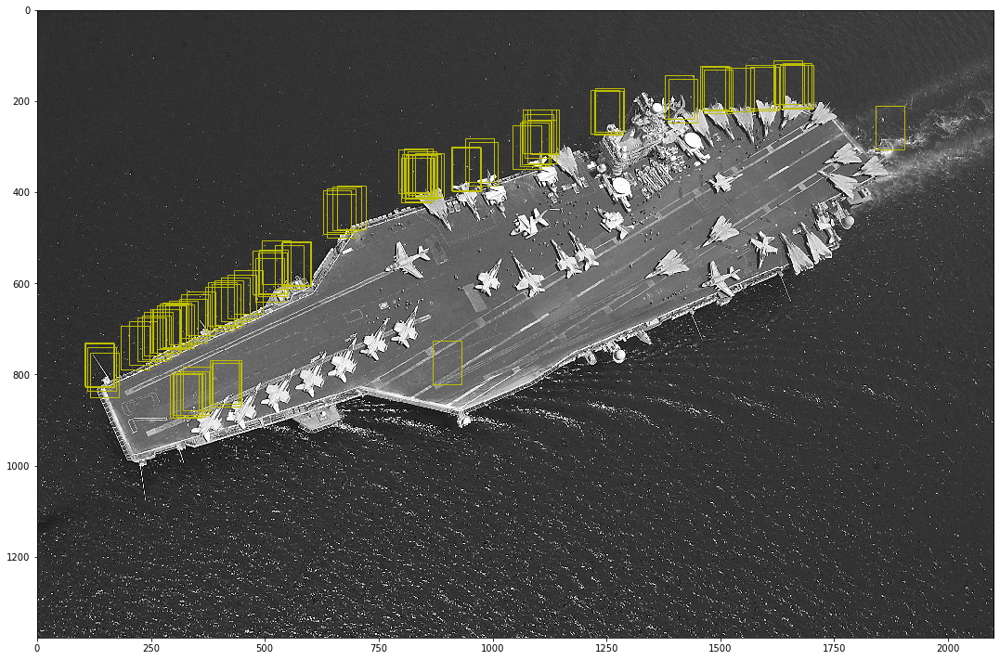

In [44]:
plt.figure(figsize=(15,10))
imshow(carrier_gray)
template_width, template_height = template.shape
for x, y in peak_local_max(result2, threshold_abs=0.3):
    rect = plt.Rectangle((y, x), template_height, template_width, color='y', 
                         fc='none')
    plt.gca().add_patch(rect);

#### Rotated template

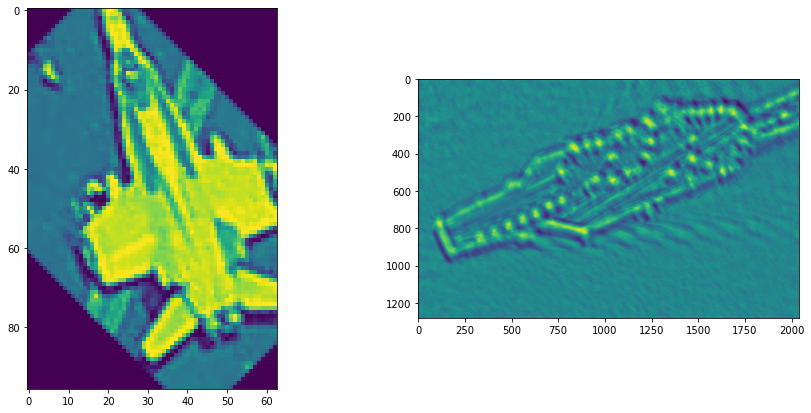

In [47]:
from skimage.transform import rotate
template3 = rotate(carrier_gray[648:744,775:838], 45.0)
result3 = match_template(carrier_gray, template3)

fig, ax = plt.subplots(1,2, figsize=(15,7))
ax[0].imshow(template3)
ax[1].imshow(result3)

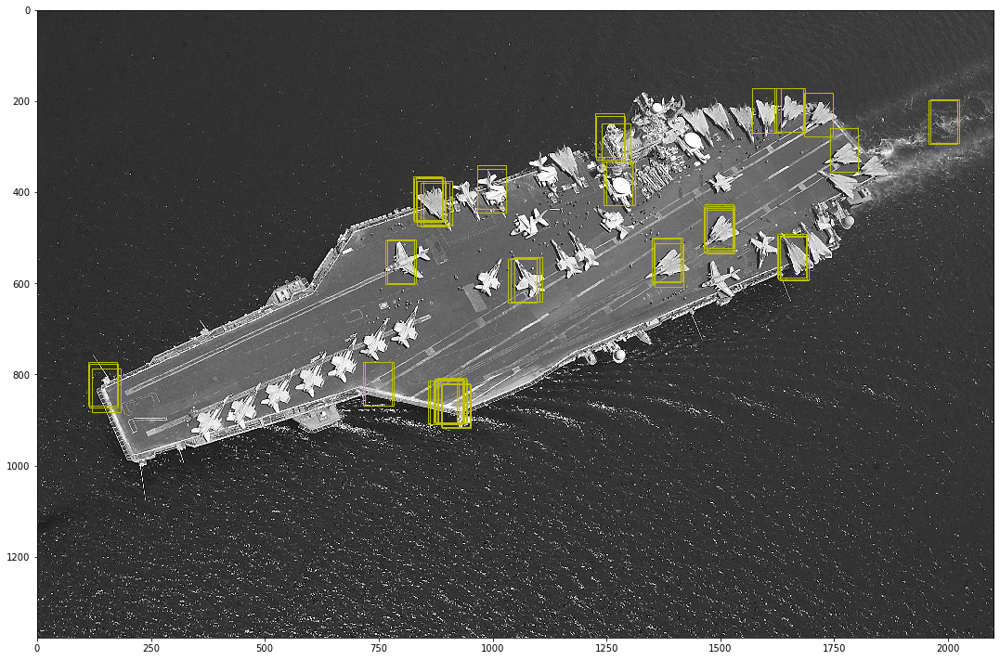

In [50]:
plt.figure(figsize=(15,10))
imshow(carrier_gray)
template_width, template_height = template.shape
for x, y in peak_local_max(result3, threshold_abs=0.4):
    rect = plt.Rectangle((y, x), template_height, template_width, color='y', 
                         fc='none')
    plt.gca().add_patch(rect);

#### High contrast

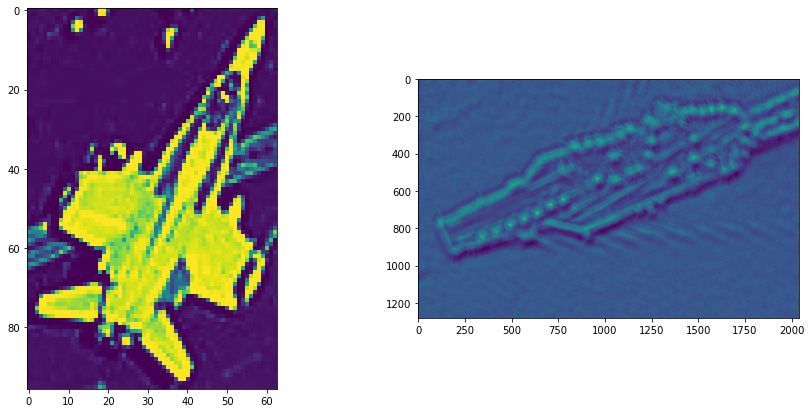

In [52]:
from skimage.exposure import adjust_sigmoid

template4 = adjust_sigmoid(carrier_gray[648:744,775:838], 0.7)
result4 = match_template(carrier_gray, template4)

fig, ax = plt.subplots(1,2, figsize=(15,7))
ax[0].imshow(template4)
ax[1].imshow(result4)

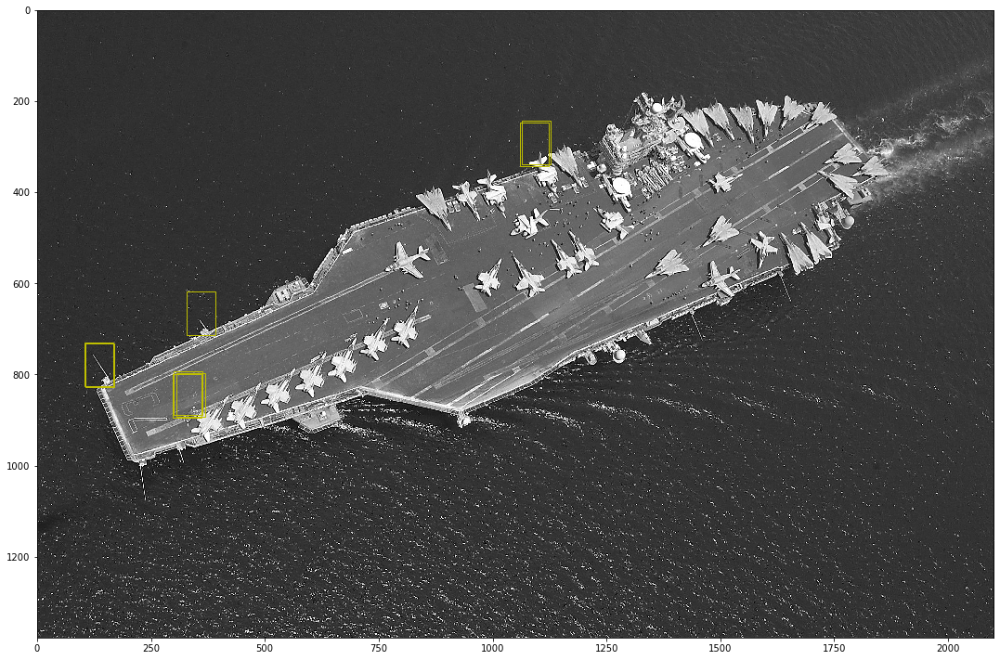

In [56]:
plt.figure(figsize=(15,10))
imshow(carrier_gray)
template_width, template_height = template.shape
for x, y in peak_local_max(result2, threshold_abs=0.35):
    rect = plt.Rectangle((y, x), template_height, template_width, color='y', 
                         fc='none')
    plt.gca().add_patch(rect);